In [111]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time
from google.colab.patches import cv2_imshow

In [112]:
data_dir = "/content/sample_data/"

In [113]:
def printi(img, img_title="image"):
    print(f"{img_title}, wymiary: {img.shape}, typ danych: {img.dtype}, wartości: {img.min()} - {img.max()}")

In [114]:
boat_img = cv2.imread(data_dir+"boat_col.png", cv2.IMREAD_UNCHANGED) 

In [115]:
house1_img = cv2.imread(data_dir+"house1_col.png", cv2.IMREAD_UNCHANGED) 

In [116]:
boat_noise_img = cv2.imread(data_dir+"boat_col_noise.png", cv2.IMREAD_UNCHANGED) 

In [117]:
house1_inoise_img = cv2.imread(data_dir+"house1_col_inoise.png", cv2.IMREAD_UNCHANGED) 

***
# $\mathbf{\text{Zadanie 1}}$<br>
***
Do realizacji zadania wykorzystać obrazy zaszumione (szumem gaussowskim oraz impulsowym). Każdy z obrazów wejściowych poddać przetwarzaniu filtrem wygładzającym (Gaussa) i filtrem medianowym. Każdy obraz wynikowy wyświetlić i obliczyć dla niego PSNR (w stosunku do obrazu oryginalnego, nie zaszumionego!, funkcja do obliczania PSNR dostępna jest w przykładowym skrypcie). Ocenić działanie filtrów dla masek o rozmiarach: 3x3, 5x5, 7x7. Zebrać w tabeli PSNR dla różnych rodzajów szumów, filtrów i rozmiarów maski. Jaki wpływ na skuteczność filtracji i na zniekształcenie obrazu ma rozmiar maski filtru? Czy ocena subiektywna uzyskanych obrazów wynikowych, jest zgodna z PSNR (lepsza jakość – większy PSNR)? Opisać wnioski w sprawozdaniu.

In [118]:
def calcPSNR(img1, img2):
  imax = 255.**2
  mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size
  return 10.0*np.log10(imax/mse)

In [119]:
masks = [(3, 3), (5, 5), (7, 7)]

In [120]:
data = []

In [121]:
def filter_and_calc_psnr(filter, masks, noise_img, original_img, title, noise):
  for mask in masks:
    start = time.time()
    blur_img = cv2.GaussianBlur(noise_img, tuple(mask), 0) if filter=='gaussa' else cv2.medianBlur(noise_img, mask[0])
    psnr = calcPSNR(original_img, blur_img)
    end = time.time()
    printi(blur_img, f"{title} z maską {mask}")
    print(f"Czas metody : {end-start:.4f}")
    print("PSNR: {:.2f}".format(psnr))
    cv2_imshow(blur_img)
    data.append({'maska':mask, 'szum':noise, 'filtr':filter, 'czas':f"{end-start:.4f}", "PSNR":float("{:.2f}".format(psnr))})

## Obrazy z szumem gaussowskim

boat_col_noise z szumem gaussowskim bez filtru, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


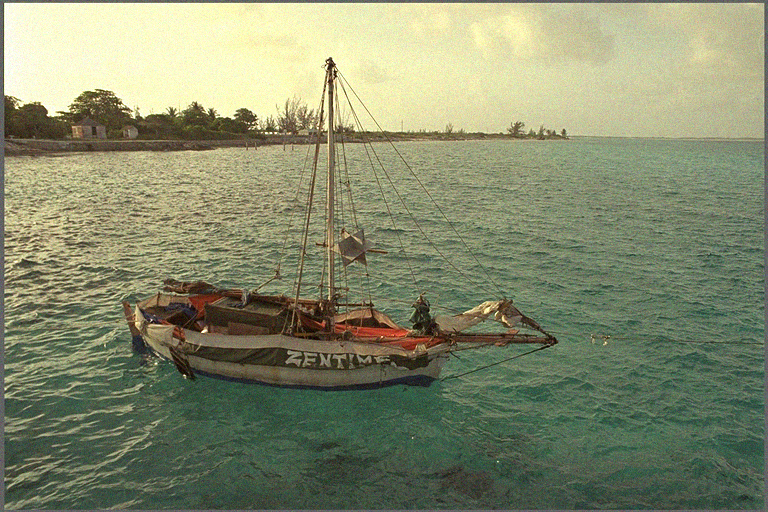

In [122]:
printi(boat_noise_img, 'boat_col_noise z szumem gaussowskim bez filtru')
cv2_imshow(boat_noise_img)

### Zastosowanie filtru Gaussa

In [123]:
filter_and_calc_psnr('gaussa', masks, boat_noise_img, boat_img, 'boat_col_noise z szumem gaussowskim z filtrem Gaussa', 'gaussowski')

Output hidden; open in https://colab.research.google.com to view.

#### Opis wniosków
Filtr Gaussa znacznie wygładza obraz. We wszystkich wyżej pokazanych przypadkach filtr skutecznie redukuje zauważalność szumu gaussowskiego rozpraszając zakłócenia na sąsiednie piksele. Im większe są wymiary maski, tym filtr powoduje większe rozmycie i zniekształcenie obrazu, nie zwiększając przy tym zauważalnie skuteczności filtracji. Najbardziej zauważalnym zniekształceniem obrazu jest rozmycie krawędzi. Najlepsze efekty wizualne są osiągane stosując maskę o wymiarach 3x3, dla większych masek rozmycie obrazu sprawia, iż staje się on mocno niewyraźny. Wraz ze wzrostem rozmiarów maski filtru, a więc również wraz ze wzrostem stopnia zniekształcenia obrazu, spada wartość PSNR. Wnioskować po tym można, iż subiektywna ocena uzyskanych obrazów jest zgodna z PSNR, który największą wartość osiąga dla rozmiaru maski 3x3.

### Zastosowanie filtru medianowego

In [124]:
filter_and_calc_psnr('medianowy', masks, boat_noise_img, boat_img, 'boat_col_noise z szumem gaussowskim z filtrem medianowym', 'gaussowski')

Output hidden; open in https://colab.research.google.com to view.

#### Opis wniosków
Filtr medianowy również zniwelował szum gaussowski. Podobnie jak to było w przypadku filtru Gaussa, wraz ze wzrostem rozmiaru maski filtru wzrasta zniekształcenie obrazu i spada wartość PSNR. Obrazy po zastosowaniu filtru medianowego są mniej wyraźne niż w przypadku zastosowania filtru Gaussa, następuje jeszcze większe rozmycie krawędzi. Ponadto zauważyć można, że czas wykonania operacji filtracji z zastosowaniem filtru medianowego jest znacznie większy niż czas wykonania operacji filtracji z zastosowaniem filtru Gaussa. Wynika to z większej złożoności obliczeniowej filtracji medianowej, która wynika z wymogu sortowania zbioru wartości pikseli każdego bloku. Do usunięcia szumu gaussowskiego dużo lepiej jest zastosować filtr Gaussa.

## Obrazy z szumem impulsowym (salt and pepper)

house1_col_inoise z szumem impulsowym bez filtru, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


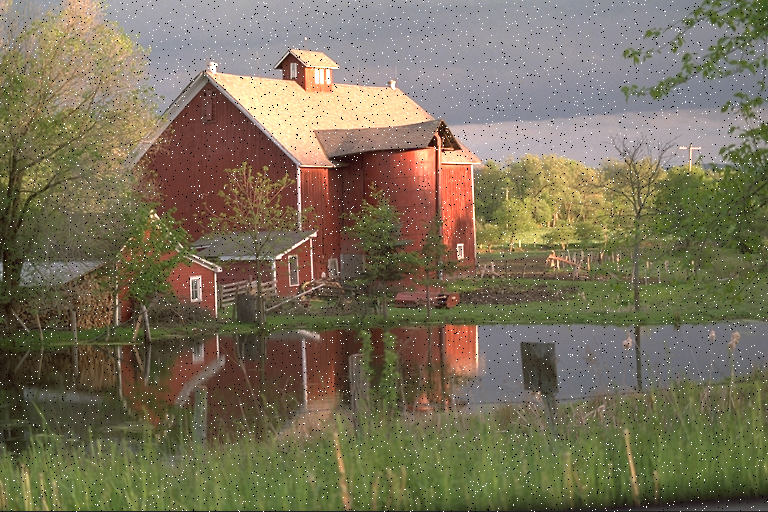

In [125]:
printi(house1_inoise_img, 'house1_col_inoise z szumem impulsowym bez filtru')
cv2_imshow(house1_inoise_img)

### Zastosowanie filtru Gaussa

In [126]:
filter_and_calc_psnr('gaussa', masks, house1_inoise_img, house1_img, 'house1_col_inoise z szumem impulsowym z filtrem gaussowskim', 'impulsowy')

Output hidden; open in https://colab.research.google.com to view.

#### Opis wniosków
Filtr Gaussa nie radzi sobie z usunięciem szumu salt and pepper. Wraz ze wzrostem rozmiaru maski, wzrasta rozmycie obrazu. Filtracja jest bardzo słaba dla wszystkich zastosowanych rozmiarów masek. Wartości PSNR dla wszystkich trzech rozmiarów masek są bardzo podobne, nieznacznie maleją wraz ze wzrostem rozmiaru masek, co ma swoje uzasadnienie, gdyż pogarsza się jakość obrazu.

### Zastosowanie filtru medianowego

house1_col_inoise z szumem impulsowym z filtrem medianowym z maską (3, 3), wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255
Czas metody : 0.0119
PSNR: 30.56


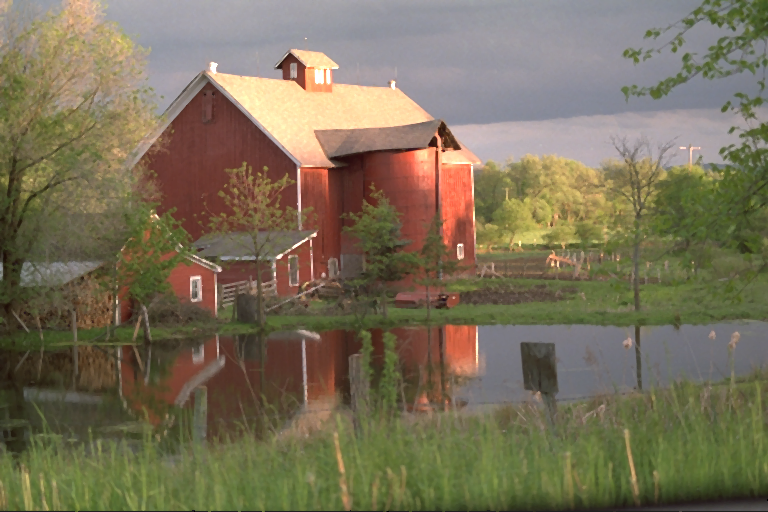

house1_col_inoise z szumem impulsowym z filtrem medianowym z maską (5, 5), wymiary: (512, 768, 3), typ danych: uint8, wartości: 9 - 255
Czas metody : 0.0191
PSNR: 27.04


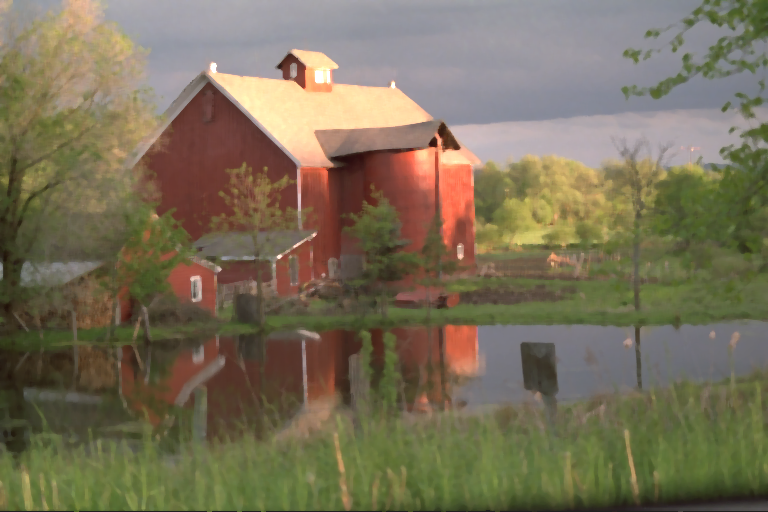

house1_col_inoise z szumem impulsowym z filtrem medianowym z maską (7, 7), wymiary: (512, 768, 3), typ danych: uint8, wartości: 13 - 255
Czas metody : 0.1141
PSNR: 25.82


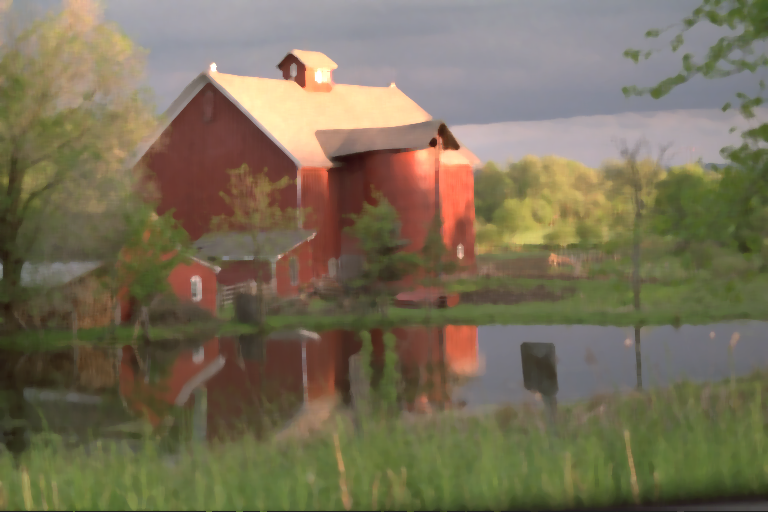

In [127]:
filter_and_calc_psnr('medianowy', masks, house1_inoise_img, house1_img, 'house1_col_inoise z szumem impulsowym z filtrem medianowym', 'impulsowy')

#### Opis wniosków
Filtr medianowy bardzo dobrze radzi sobie z szumem salt and pepper. Filtr ten dobrze radzi sobie z zakłóceniami typu salt and pepper, ponieważ wartości odstające (szum) w drodze sortowania przyjmują skrajne pozycje w uporządkowanym ciągu pikseli i nie mogą być wybrane jako mediana. Po czasach wykonania metody, zauważyć można, że filtr ma większą od filtru Gaussa złożoność obliczeniową. Mimo bardzo dobrych efektów przy zastosowaniu maski rozmiaru 3x3, przy zastosowaniu większych rozmiarów masek obraz staje się bardzo rozmyty, dużo bardziej niż po zastosowaniu filtru Gaussa. Przy zastosowaniu maski rozmiaru 3x3 wartość PSNR jest bardzo wysoka (ponad 30), aczkolwiek dla masek rozmiarów 5x5 oraz 7x7 wartość PSNR jest mniejsza niż dla odpowiadających masek przy zastosowaniu filtru Gaussa.

In [128]:
df = pd.DataFrame(data)

In [129]:
df

,maska,szum,filtr,czas,PSNR
0,"(3, 3)",gaussowski,gaussa,0.0105,28.48
1,"(5, 5)",gaussowski,gaussa,0.0131,26.59
2,"(7, 7)",gaussowski,gaussa,0.0164,25.17
3,"(3, 3)",gaussowski,medianowy,0.0099,27.06
4,"(5, 5)",gaussowski,medianowy,0.0193,24.37
5,"(7, 7)",gaussowski,medianowy,0.0971,23.63
6,"(3, 3)",impulsowy,gaussa,0.0488,27.77
7,"(5, 5)",impulsowy,gaussa,0.0106,27.69
8,"(7, 7)",impulsowy,gaussa,0.0258,27.00
9,"(3, 3)",impulsowy,medianowy,0.0119,30.56


## Wnioski końcowe
W każdym przypadku najwyższa wartość PSNR osiągana jest dla rozmiaru maski 3x3. Zarazem, w każdym z przypadków im wyższa wartość PSNR tym obraz jest mniej zniekształcony i czytelny. Wraz ze wzrostem wielkości maski, rośnie nie tylko złożoność obliczeniowa filtracji, ale również spada jakość otrzymanego obrazu (jest on coraz bardziej zniekształcony i rozmyty).<br>
Na podstawie wartości PSNR oraz wizualnej oceny obrazów wnioskować można, iż szum gaussowski lepiej jest usuwany przy pomocy filtru Gaussa, natomiast szum impulsowy (salt and pepper) przy pomocy filtru medianowego.<br>
Obserwując zmierzone czasy wykonania metod zauważyć można, że zastosowanie filtru medianowego wiąże się z większą złożonością obliczeniową.<br>
Zauważyć również można, że dla większych wielkości masek filtr medianowy bardziej rozmywa obraz niż filtr Gaussa. 

***
# $\mathbf{\text{Zadanie 2}}$<br>
***
Zrealizować operację wyrównania histogramu dla obrazu barwnego i zapisać obraz wynikowy do pliku. UWAGA: operację wyrównania histogramu należy wykonać wyłącznie dla składowej odpowiadającej za jasność, w tym celu należy wejściowy obraz RGB skonwertować do innej przestrzeni (np. YCbCr/YUV), a po wyrównaniu histogramu dla właściwej składowej powrócić do pierwotnego formatu. Porównać uzyskane obrazy i ich histogramy (w szczególności: histogram dla składowej, dla której wykonano operację wyrównywania histogramu). Czy obraz po wyrównaniu histogramu jest subiektywnie lepszej jakości?

In [153]:
def print_hist(img, color = ('b','g','r'), title=''):
  for i,col in enumerate(color):
      histr = cv2.calcHist([img],[i],None,[256],[0,256])
      plt.plot(histr,color = col)
      plt.xlim([0,256])
      plt.title(title)

In [155]:
boat_ycrcb = cv2.cvtColor(boat_img, cv2.COLOR_BGR2YCrCb)  # Konwersja do przestrzeni barw YCrCb

#### Histogram obrazu w przestrzeni barw YCrCb
* Y -> niebieski
* Cr -> zielony
* Cb -> czerwony

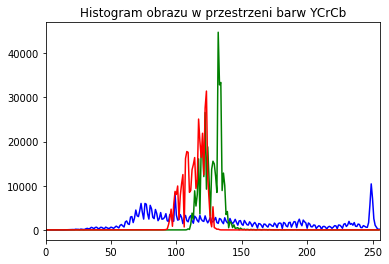

In [158]:
print_hist(boat_ycrcb, title='Histogram obrazu w przestrzeni barw YCrCb')

Text(0.5, 1.0, 'Histogram składowej Y obrazu w przestrzeni barw YCrCb')

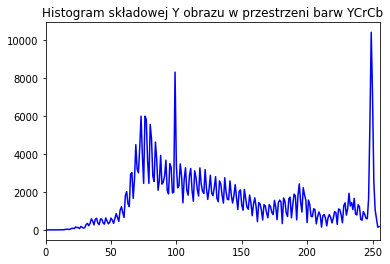

In [161]:
histr_y = cv2.calcHist([boat_ycrcb],[0],None,[256],[0,256])
plt.plot(histr_y, color='b')
plt.xlim([0,256])
plt.title('Histogram składowej Y obrazu w przestrzeni barw YCrCb')

##### Wyrównanie histogramu składowej Y

In [162]:
equ_boat_img = np.zeros(boat_ycrcb.shape, dtype=boat_ycrcb.dtype) # pusty obraz wynikowy

In [163]:
equ_boat_img[:,:,0] = cv2.equalizeHist(boat_ycrcb[:,:,0]) # wyrównanie histogramu dla składowej Y
equ_boat_img[:,:,1] = boat_ycrcb[:,:,1]
equ_boat_img[:,:,2] = boat_ycrcb[:,:,2]

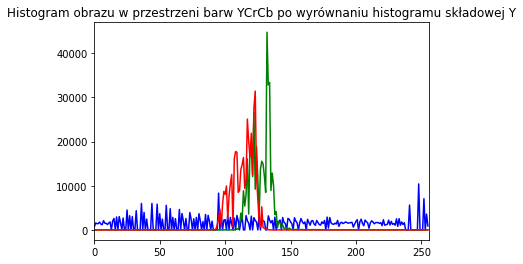

In [164]:
print_hist(equ_boat_img, title='Histogram obrazu w przestrzeni barw YCrCb po wyrównaniu histogramu składowej Y')

Text(0.5, 1.0, 'Wyrównany histogram składowej Y obrazu w przestrzeni barw YCrCb')

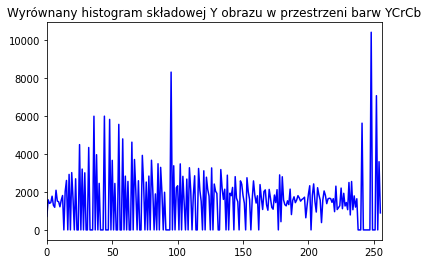

In [165]:
histr_y = cv2.calcHist([equ_boat_img],[0],None,[256],[0,256])
plt.plot(histr_y, color='b')
plt.xlim([0,256])
plt.title('Wyrównany histogram składowej Y obrazu w przestrzeni barw YCrCb')

In [166]:
final_img = cv2.cvtColor(equ_boat_img, cv2.COLOR_YCrCb2BGR) # Powrót do przestrzeni kolorów BGR

In [168]:
cv2.imwrite(data_dir+"out_equalized_img.png", final_img)

True

## Porównanie uzyskanych obrazów

Obraz barwny przed wyrównaniem histogramu, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


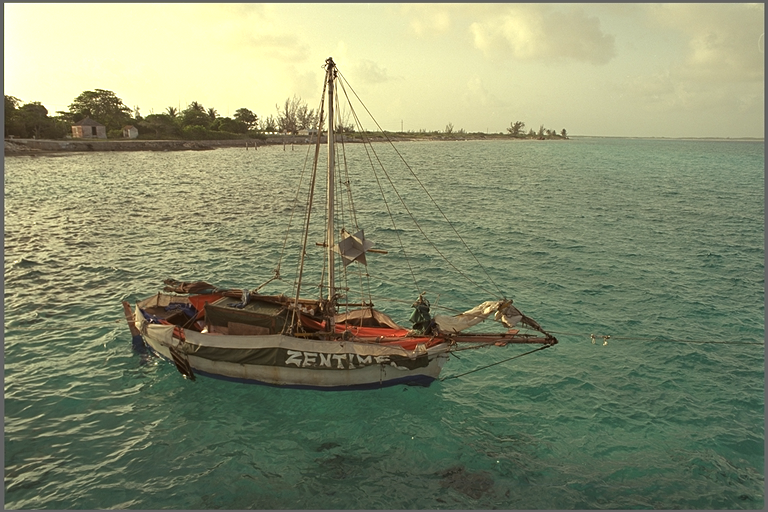

Obraz barwny po wyrównaniu histogramu, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


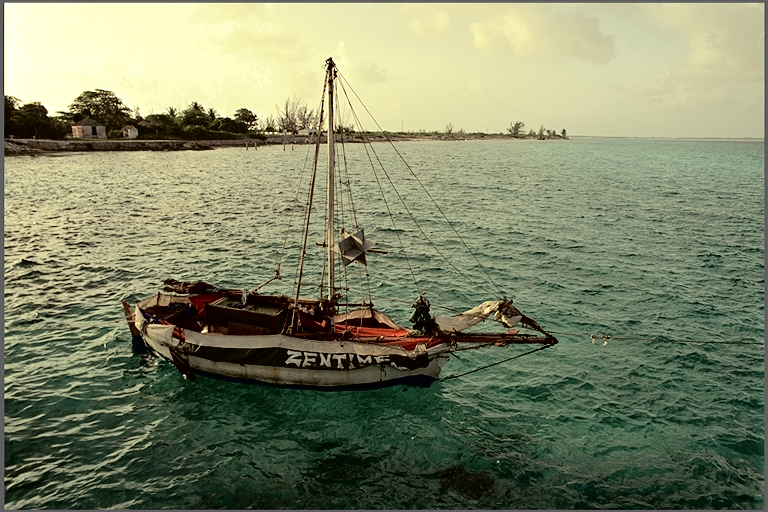

In [174]:
printi(boat_img, img_title='Obraz barwny przed wyrównaniem histogramu')
cv2_imshow(boat_img)
printi(final_img, img_title='Obraz barwny po wyrównaniu histogramu')
cv2_imshow(final_img)

## Wnioski końcowe
Histogram składowej Y jest "płaski" - na całym zakresie osiąga wartości bardzo podobne. Znaczna większość wartości pikseli składowej Y pojawia się na histogramie po wyrównaniu, prawie cały zakres jest wypełniony.<br>
Porównując obraz wyjściowy z wejściowym, można zauważyć, że obraz wyjściowy ma znacznie zwiększony kontrast. Szczególnie efekt ten widać na wodzie, gdzie na obrazie wejściowym wydawaje się, że woda przyjmuje wszędzie bardzo podobny kolor. Na obrazie wyjściowym natomiast, różnica między odcieniem wody na obrazie poniżej statku, a wody w oddali, jest bardzo zauważalna. Na obrazie wyjściowym widać też więcej szczegółów. Obraz po operacji wyrównania histogramu nie traci na jakości.

***
# $\mathbf{\text{Zadanie 3}}$<br>
***
Korzystając z filtru Laplace’a do wyznaczenia wysokoczęstotliwościowych składowych obrazu dokonać wyostrzenia obrazu:
 $img_{out} = img_{in} + W*img_{laplace}$. Jaki jest wpływ wagi składowej wysokoczęstotliwościowej na postać obrazu wynikowego? Dla jakich wartości tej wagi uzyskuje się dobre, przyjemne dla oka wyniki? Uwaga: należy pamiętać, że wyostrzanie obrazu powoduje również uwydatnienie szumu w obrazie, w niektórych przypadkach (niezbyt dobrej jakości obrazów oryginalnych) przydatne może być wstępne wygładzenie obrazu filtrem dolnoprzepustowym (np. filtrem Gaussa). Wskazówka: wykorzystać funkcję cv2.addWeighted() do sumowania obrazów i równoczesnej konwersji wyniku do 8-bitowych liczb całkowitych z przedziału [0, 255]. Uwaga: ze względu na sposób wyliczania laplasjanu w bibliotece OpenCV w celu uzyskania ‘dobrych’ wyników należy odjąć ‘obraz wysokoczęstotliwościowy’, czyli zastosować ujemne wartości wagi $W$.

### Zastosowanie maski Laplace'a

In [175]:
lap_img = cv2.Laplacian(boat_img, -1) 

Obraz krawędziowy po zastosowaniu maski Laplace'a, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


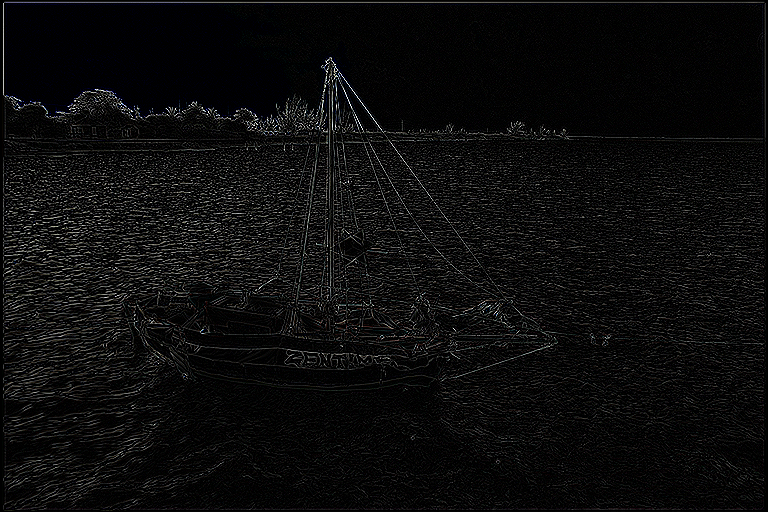

In [189]:
printi(boat_img, img_title='Obraz krawędziowy po zastosowaniu maski Laplace\'a')
cv2_imshow(np.abs(lap_img))

### Porównanie otrzymanych obrazów dla różnych wartości wag

Obraz wejściowy bez maski Laplace'a, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


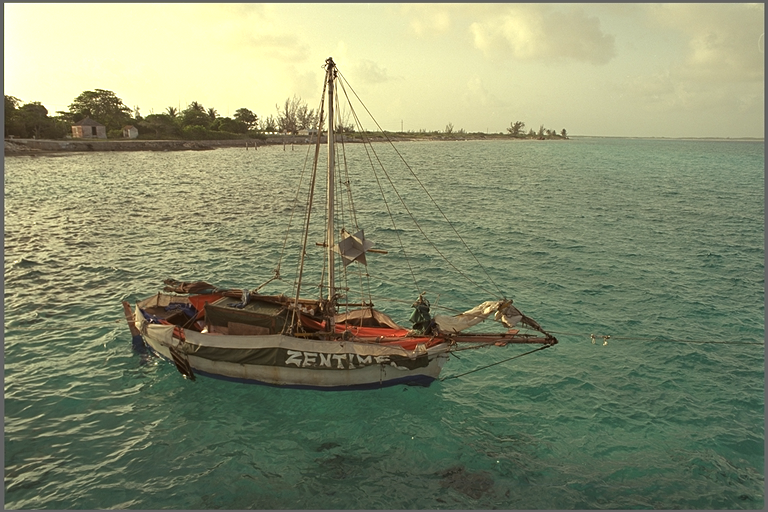

In [188]:
printi(boat_img, img_title='Obraz wejściowy bez maski Laplace\'a')
cv2_imshow(boat_img)

Obraz wyostrzony z wartością wag W=-0.5, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


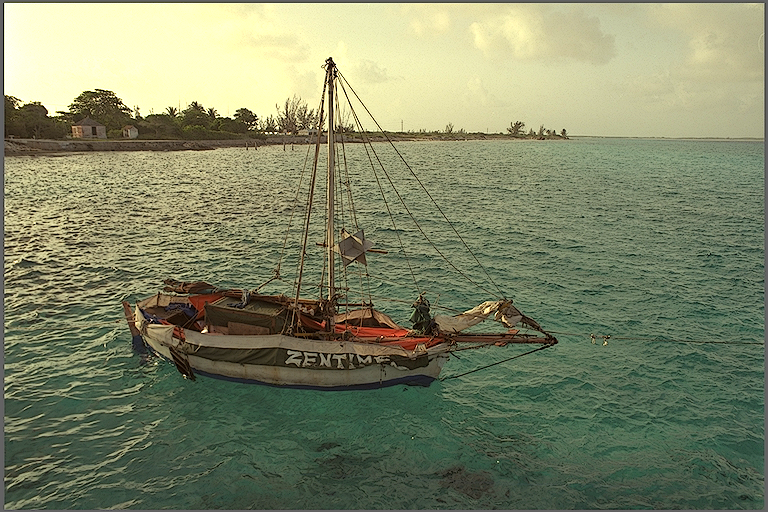

In [181]:
out_img = cv2.addWeighted(boat_img, 1, lap_img.astype(np.uint8), -0.5, 0)
printi(boat_img, img_title='Obraz wyostrzony z wartością wag W=-0.5')
cv2_imshow(out_img)

Obraz wyostrzony z wartością wag W=-0.25, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


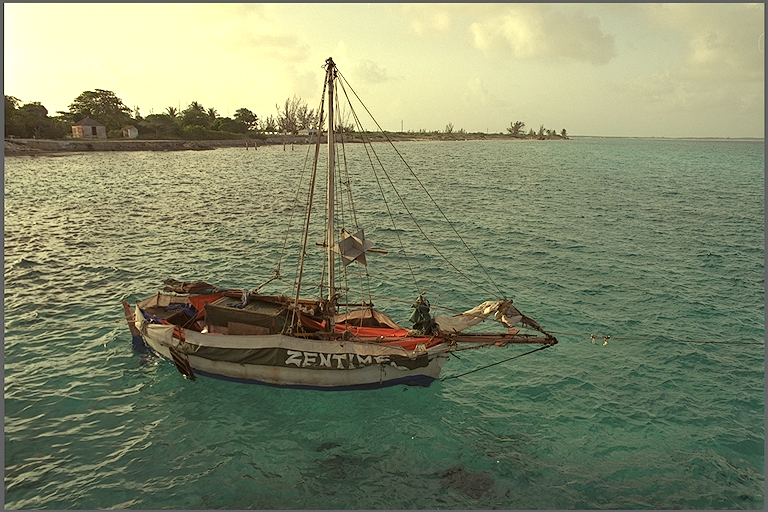

In [186]:
out_img = cv2.addWeighted(boat_img, 1, lap_img.astype(np.uint8), -0.25, 0)
printi(boat_img, img_title='Obraz wyostrzony z wartością wag W=-0.25')
cv2_imshow(out_img)

Obraz wyostrzony z wartością wag W=-1, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


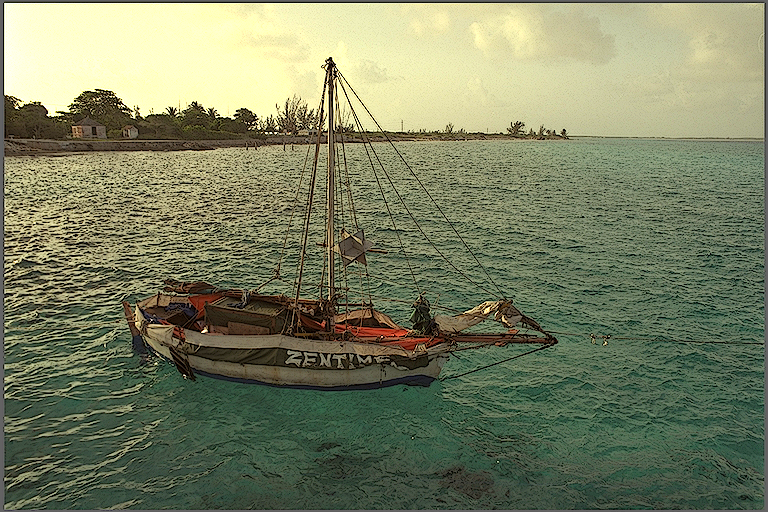

In [182]:
out_img = cv2.addWeighted(boat_img, 1, lap_img.astype(np.uint8), -1, 0)
printi(boat_img, img_title='Obraz wyostrzony z wartością wag W=-1')
cv2_imshow(out_img)

Obraz wyostrzony z wartością wag W=-3, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255


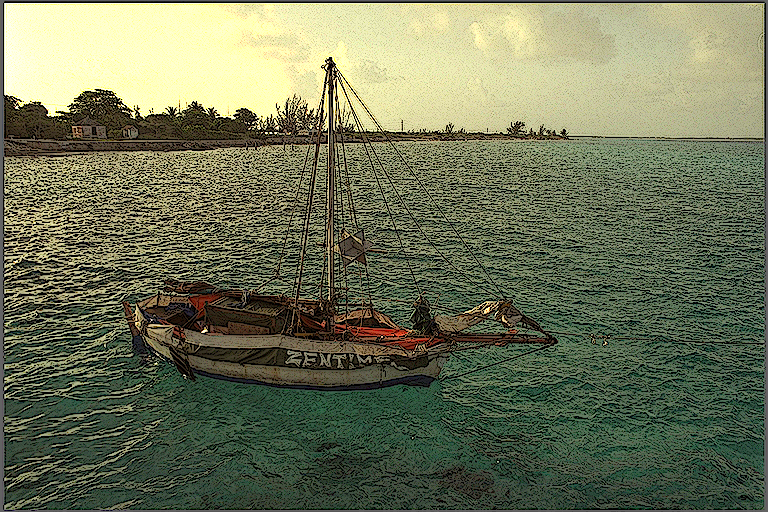

In [185]:
out_img = cv2.addWeighted(boat_img, 1, lap_img.astype(np.uint8), -3, 0)
printi(boat_img, img_title='Obraz wyostrzony z wartością wag W=-3')
cv2_imshow(out_img)

## Wnioski końcowe
Obrazy wyjściowe po zastosowaniu filtru Laplace'a są wyraźnie wyostrzone. Efekt ten wyraźnie można dostrzec porównując krawędzie fal na wodzie, oraz krawędzie statku.<br>
Bazując na porównanych przeze mnie wyników dla różnych wag składowej częstotliwościowej najlepsze wizualne efekty obrazu otrzymuje się dla wag z zakresu [-1, 0]. Dla wag o mniejszych wartościach od -1, stają się zauważalne wszystkie krawędzie na obrazie, co wywołuje nieporządany efekt - obraz staje się mniej realistyczny. Im mniejsze są wagi składowej częstotliwościowej, tym bardziej widoczne są krawędzie, które widać na obrazie krawędziowym.